<a href="https://colab.research.google.com/github/tuananh28394/Capital-Bikeshare/blob/main/E_commerce_Review.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Text Analytics of E-commerce industry

The rise of e-commerce is fueled by the increasing availability of online access and the widespread use of smartphones. One area with tremendous potential in this domain is women's clothing. According to the Fashion eCommerce Report 2020 by Statista, the fashion sector represents the largest B2C eCommerce market segment, with a global size of 9. It is projected to grow at a rate of 12.2% annually and reach a total market size of US$991.64 billion by the end of 2024.

Furthermore, user recommendations and ratings play a significant role as key performance indicators (KPIs) for running a successful e-commerce business. These KPIs provide valuable insights to e-commerce store owners regarding their customers' purchasing experiences. By leveraging this information, owners can make informed decisions to enhance both the browsing and purchasing processes. Since customers cannot physically try on or touch the items, the reviews and feedback from other customers become crucial factors influencing their willingness to make a purchase.

## Data

The Kaggle dataset titled "Women's E-Commerce Clothing Reviews" is a comprehensive collection comprising more than 230,000 customer reviews and ratings specifically focused on e-commerce clothing for women.

## Purposes

After the dataset is cleaned, it has been refined to include 23,486 complete observations. We are interested in exploring the following relationships within the dataset:

**Age and Rating**: My aim to determine whether there is any correlation between a customer's age and the rating they provide for the product.

**Recommended and Rating**: My objective is to investigate whether there are variations in the likelihood of recommending a product based on different rating levels.

**Rating & Review Texts**: I want to analyze the word choice used in customer reviews corresponding to different ratings, in order to gain insights into customer sentiment regarding the products.

## Methods and models

**Word Cloud**: The word cloud visualization technique is applied to highlight popular or trending terms/words based on their frequency of use and prominence in the dataset.

**Term Frequency-Inverse Document Frequency (TF-IDF)**: Scikit-learn provides two approaches to vectorize text and obtain the TF-IDF weight matrix. One approach involves a two-part process: first, using CountVectorizer to count word occurrences in each review, followed by TfidfTransformer to calculate word weights and generate the weight matrix. It allows us to assign a numerical value to each word in a review, representing its importance.

**Support Vector Machine (SVM)**: SVM is a classification algorithm that draws hyperplanes to separate data into different categories based on patterns. It is commonly used in text categorization, image classification, handwriting recognition, and other scientific fields. However, SVM may not be suitable for large datasets with significant noise.

**(Multinomial) Naive Bayes**: Naive Bayes is a probabilistic machine learning model that calculates the probability of event A occurring given that event B has occurred. It is commonly used for classification tasks.

**Tree-based Methods:**

- Random Forest: It consists of multiple individual decision trees, and the final classification is determined by majority voting. However, there may be a covariate shift problem if the training and prediction inputs have different ranges.

- XGBoost (Extreme Gradient Boosting): XGBoost utilizes second-order gradients to extract additional information about the gradient's direction, leading to improved model generalization. It also incorporates regularization techniques.

In [ ]:
# Load Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline

In [ ]:
# Read the data
data = pd.read_csv("D:\\Machine Learning\\Womens Clothing E-Commerce Reviews.csv", index_col = False)

In [ ]:
data = data.drop("Unnamed: 0", axis = 1)

In [ ]:
data.head(10)

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses
5,1080,49,Not for the very petite,"I love tracy reese dresses, but this one is no...",2,0,4,General,Dresses,Dresses
6,858,39,Cagrcoal shimmer fun,I aded this in my basket at hte last mintue to...,5,1,1,General Petite,Tops,Knits
7,858,39,"Shimmer, surprisingly goes with lots","I ordered this in carbon for store pick up, an...",4,1,4,General Petite,Tops,Knits
8,1077,24,Flattering,I love this dress. i usually get an xs but it ...,5,1,0,General,Dresses,Dresses
9,1077,34,Such a fun dress!,"I'm 5""5' and 125 lbs. i ordered the s petite t...",5,1,0,General,Dresses,Dresses


**Exploratory Data Analysis**

In [ ]:
data.describe().T.drop("count",axis=1)

,mean,std,min,25%,50%,75%,max
Clothing ID,918.118709,203.298980,0.0,861.0,936.0,1078.0,1205.0
Age,43.198544,12.279544,18.0,34.0,41.0,52.0,99.0
Rating,4.196032,1.110031,1.0,4.0,5.0,5.0,5.0
Recommended IND,0.822362,0.382216,0.0,1.0,1.0,1.0,1.0
Positive Feedback Count,2.535936,5.702202,0.0,0.0,1.0,3.0,122.0


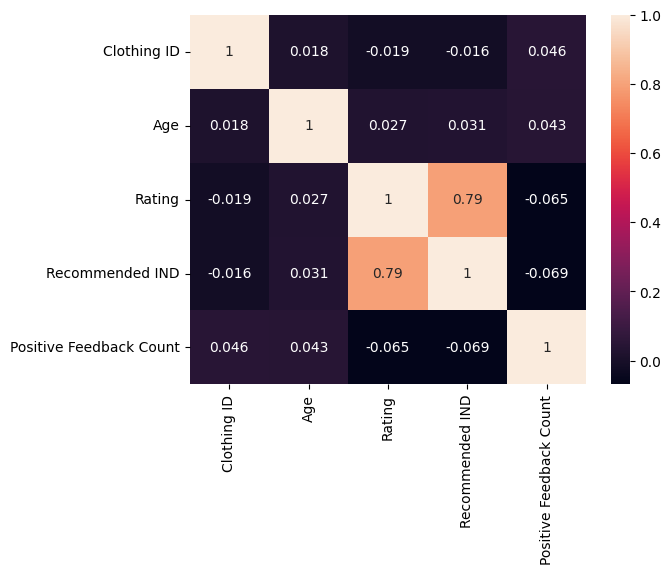

In [ ]:
selected_columns = ["Clothing ID", "Age", "Rating", "Recommended IND", "Positive Feedback Count"]
corrMatrix = data[selected_columns].corr()
sns.heatmap(corrMatrix, annot=True)
plt.show()

**Data Exploration by Visualizations**

**Customer’s Age Distribution**

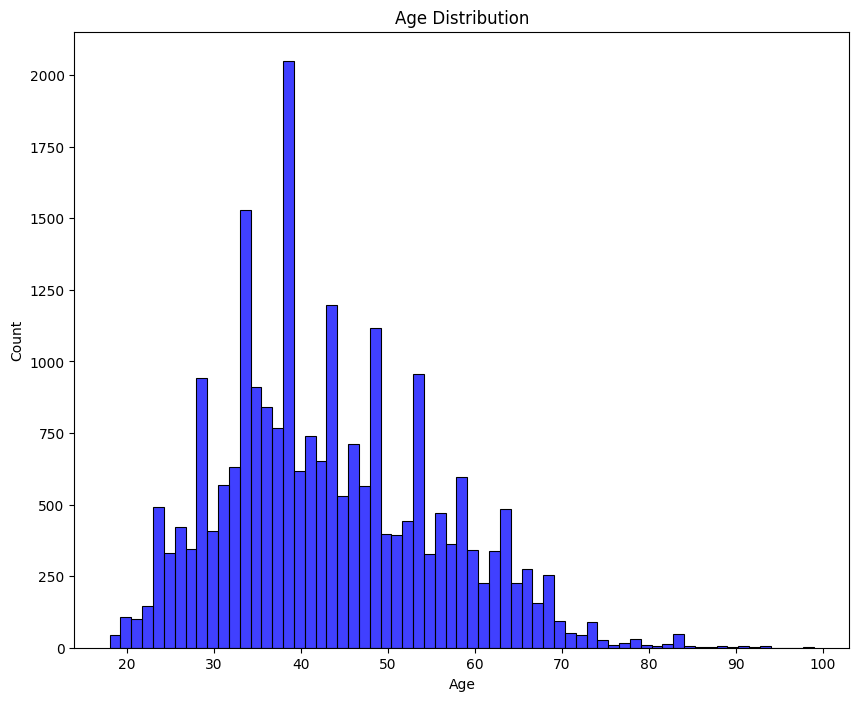

In [ ]:
fig = plt.figure(figsize=(10, 8))
sns.histplot(data["Age"], color='blue')
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

Based on the graph provided, it is evident that the brand's target customers are mostly between the ages of 30 and 50.


**Customer Rating and Recommendation IND Data Distribution**

[Text(0.5, 0, 'Recommendation'),
 Text(0, 0.5, 'Counts'),
 Text(0.5, 1.0, 'Recommendation Distribution')]

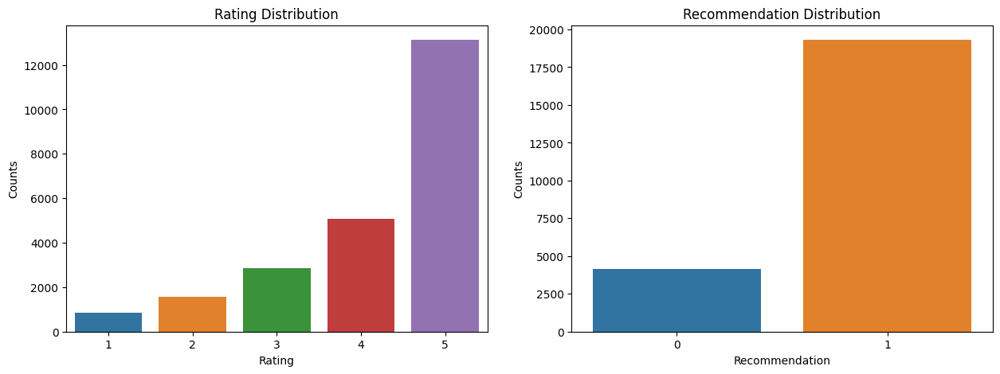

In [ ]:
f, axes = plt.subplots(1,2, figsize = (15,5))
rating_counts = data['Rating'].value_counts()

ax1 = sns.barplot(x=rating_counts.index, y=rating_counts.values, ax=axes[0])
ax1.set(xlabel='Rating', ylabel='Counts', title='Rating Distribution')

recommendation_counts = data['Recommended IND'].value_counts()
ax2 = sns.barplot(x=recommendation_counts.index, y=recommendation_counts.values, ax=axes[1])
ax2.set(xlabel='Recommendation', ylabel='Counts', title='Recommendation Distribution')


From the above left-handed side graph, it is clear that the reviews are mostly positive as the majority of the ratings are 4 or 5 out of 5.

Based on the graph on the right-hand side, the Recommended IND is a binary variable. A value of 1 indicates that the customer recommends the product, while a value of 0 indicates that they do not recommend it. It appears that the majority of customers recommend the product.

Text(0.5, 1.0, 'Rating v.s. Recommended')

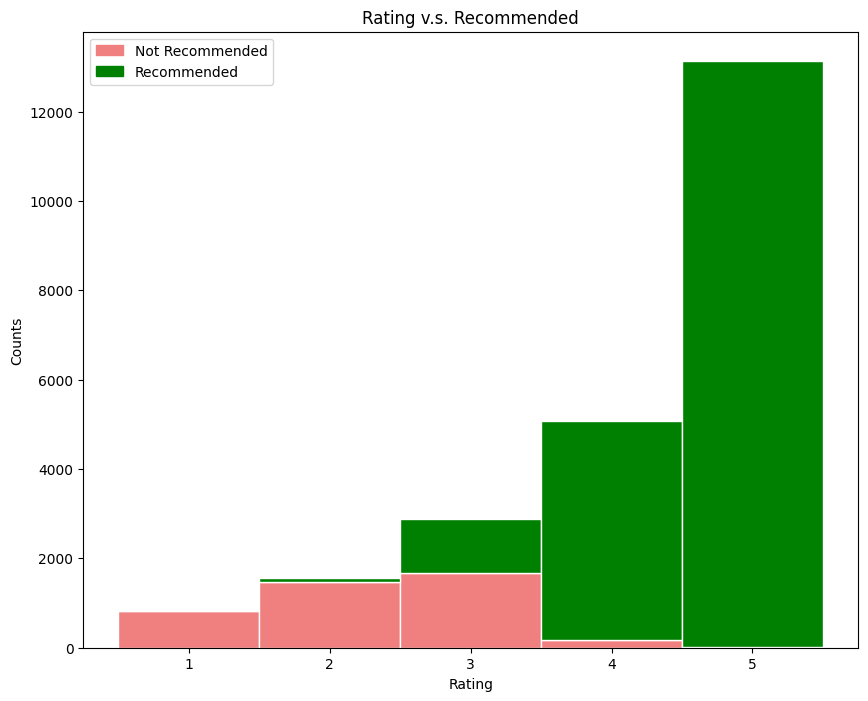

In [ ]:
# Rating vs Recommended
fig = plt.figure(figsize=(10,8))
r = [1,2,3,4,5]
x1 = []
for i in range(1,6,1):
    x1.append(len(data[(data['Recommended IND'] == 0) & (data['Rating'] == i)]))
x2 = []
for i in range(1,6,1):
    x2.append(len(data[(data['Recommended IND'] == 1) & (data['Rating'] == i)]))

# Assign colors for recommended and the names
colors = ['lightcoral', 'green']
names = ['Not Recommended', 'Recommended']

# Names of group and bar width
names = ['1','2','3','4','5']
barWidth = 1

# Create lower bars
plt.bar(r, x1, color='lightcoral', edgecolor='white', width=barWidth)
# Create upper bars, on top of the firs ones
plt.bar(r, x2, bottom=x1, color='green', edgecolor='white', width=barWidth)

# Plot formatting
plt.xticks(r, names)
plt.xlabel("Rating")
plt.ylabel('Counts')
blue_patch = mpatches.Patch(color='lightcoral', label='Not Recommended')
pink_patch = mpatches.Patch(color='green', label='Recommended')
plt.legend(handles=[blue_patch, pink_patch])
plt.title('Rating v.s. Recommended')

It can be seen that when the product's rating score is 4 or 5, customers mostly recommend the product. Meanwhile, whe the rating is 3 or less, they tend to not recommend it. We would further analyze more details.

**Age and Rating Distribution**

Text(0.5, 1.0, 'Age v.s. Rating Counts')

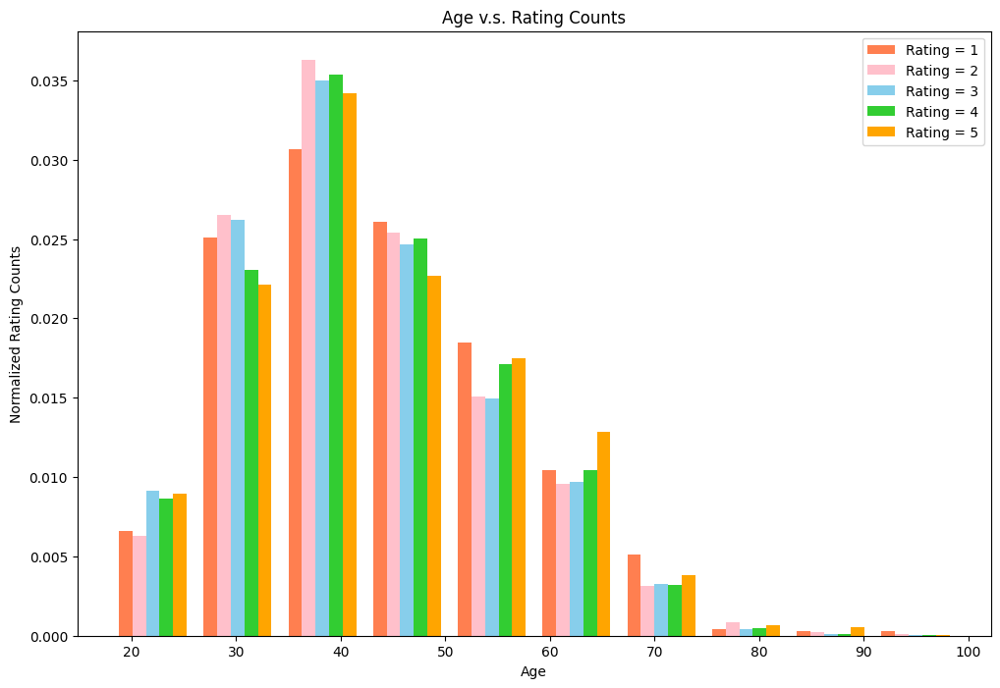

In [ ]:
# Age vs Rating
fig = plt.figure(figsize=(12, 8))
x1 = list(data[data['Rating'] == 1]['Age'])
x2 = list(data[data['Rating'] == 2]['Age'])
x3 = list(data[data['Rating'] == 3]['Age'])
x4 = list(data[data['Rating'] == 4]['Age'])
x5 = list(data[data['Rating'] == 5]['Age'])
# Assign colors for each airline and the names
colors = ['coral', 'pink', 'skyblue', 'limegreen', 'orange']
names = ['Rating = 1', 'Rating = 2', 'Rating = 3','Rating = 4', 'Rating = 5']
# Make the histogram using a list of lists
# Normalize the flights and assign colors and names
plt.hist([x1, x2, x3, x4, x5], density = 1, color = colors, label=names)
# Plot formatting
plt.legend()
plt.xlabel('Age')
plt.ylabel('Normalized Rating Counts')
plt.title('Age v.s. Rating Counts')

As we knew before, the majority of our customers' ages are between 30 and 50.

From the graph describing the age and rating, it is fascinating to see that among the majority of target customer groups, there are more customers who give a lower rating score (1-2) than those who give a higher rating score (4-5). However, younger customers (around 20 years old) and older customers (around 60 years old) tend to give higher rating scores (4-5). To benefit the business, further analysis should be conducted to determine why customers in the majority target group tend to give more lower rating scores (1-2) than higher rating scores (4-5).

**Customer Review's Text Analysis**

In [ ]:
from wordcloud import WordCloud, STOPWORDS
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

In [ ]:
def clean_text_data(text_data):
    word_list = []
    for val in text_data:
        text = str(val)
        text = text.lower()
        tokens = word_tokenize(text)
        words = [word for word in tokens if word.isalpha()]
        for w in words:
            word_list.append(w)
    return(word_list)

In [ ]:
def create_cloud_graph(string):
    s = " "
    stopwords = set(STOPWORDS) | {'dress','top','bottom','jean','jeans','skirt','pants','look','lookes','looked','shirt','jacket','blouse','sweater'}
    ww = s.join(string)
    wordcloud = WordCloud(width=1600, height=800, stopwords = stopwords, max_words = 100).generate(ww)
    plt.figure(figsize=(20,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.margins(x=0, y=0)
    plt.show()

In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\anhpnt\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

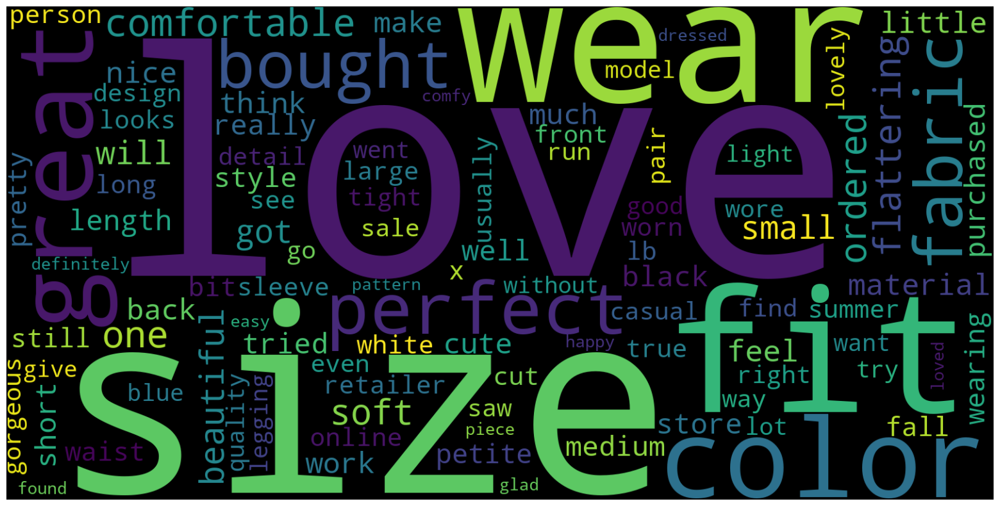

In [ ]:
#Rating = 5
rating5 = clean_text_data(data[data['Rating']==5]['Review Text'])
create_cloud_graph(rating5)

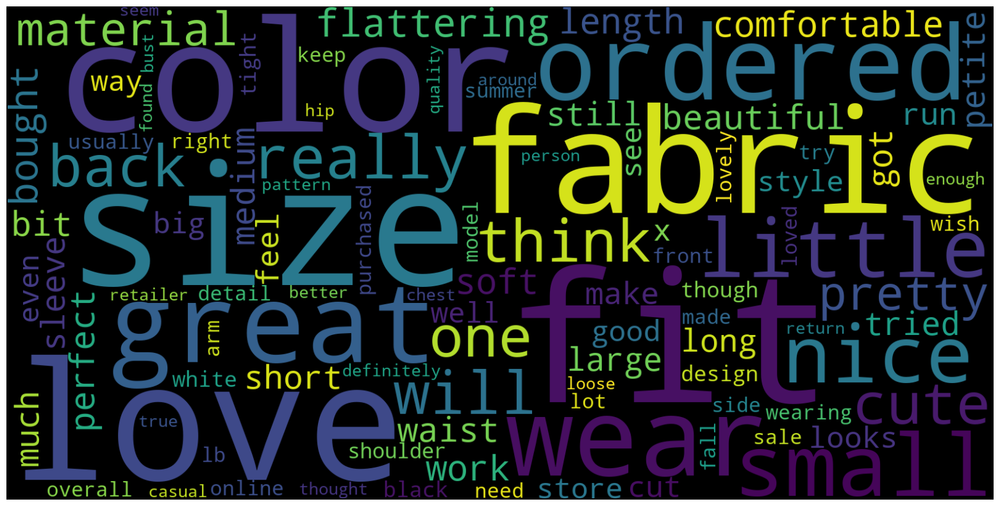

In [ ]:
#Rating = 4
rating4 = clean_text_data(data[data['Rating']==4]['Review Text'])
create_cloud_graph(rating4)

From the graphs, we could see that most of the review texts have positive words. For example, they are love, great, beautiful, perfect, and comfortable.

Now, we do the similar approaches with rating scores of 1, 2, and 3

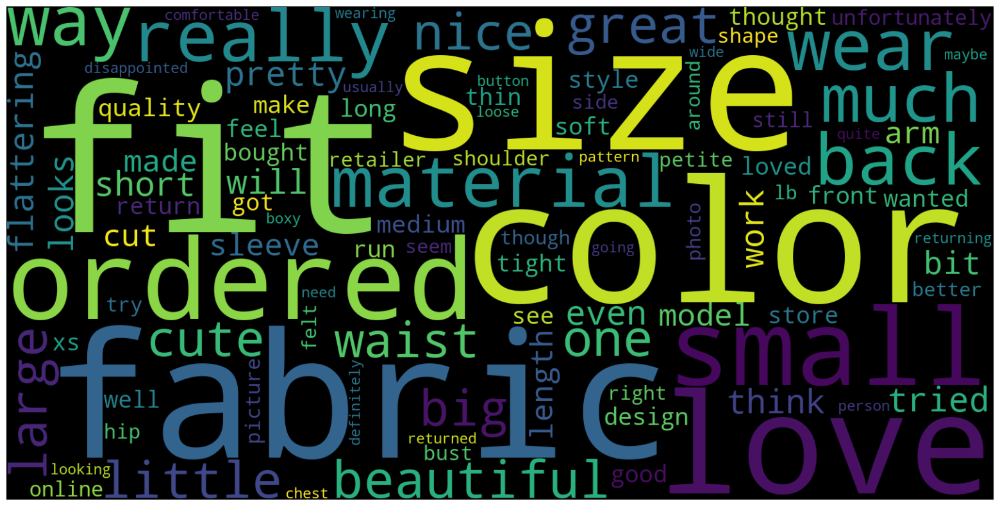

In [ ]:
#Rating = 3
rating3 = clean_text_data(data[data['Rating']==3]['Review Text'])
create_cloud_graph(rating3)

For this level, there are some negative words included in the review texts such as small, short, back, return.

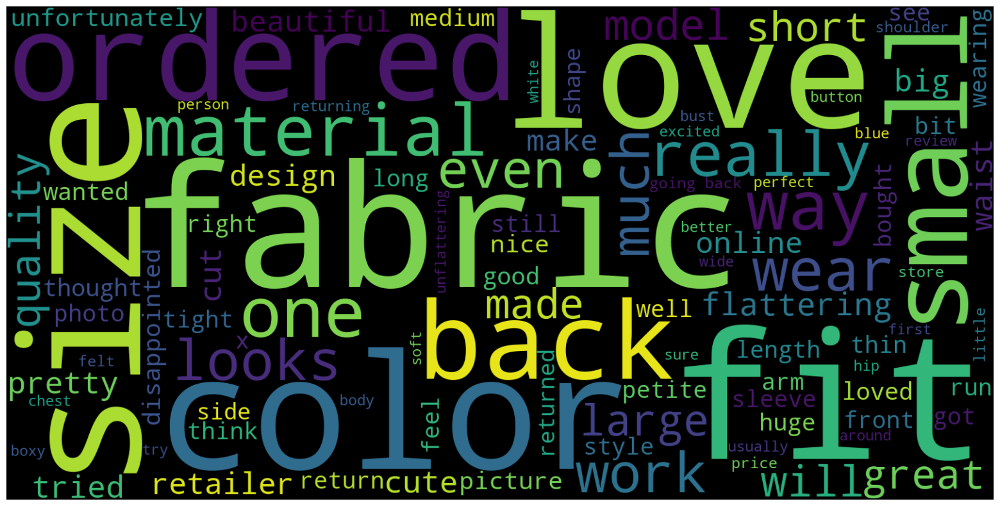

In [ ]:
#Rating = 2
rating2 = clean_text_data(data[data['Rating']==2]['Review Text'])
create_cloud_graph(rating2)

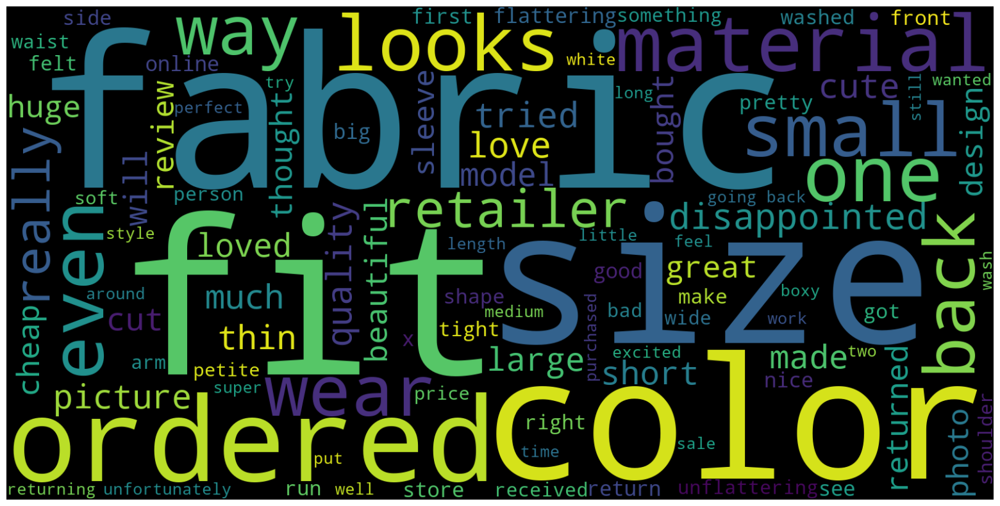

In [ ]:
#Rating = 1
rating1 = clean_text_data(data[data['Rating']==1]['Review Text'])
create_cloud_graph(rating1)

With the rating scores of 1 or 2, we could see there are more negative words, which are cheap, small, returned, disappointed, and unflattering.

**Text Processing**

In [ ]:
data1 = data
data1["Review Text"].head()

0    Absolutely wonderful - silky and sexy and comf...
1    Love this dress!  it's sooo pretty.  i happene...
2    I had such high hopes for this dress and reall...
3    I love, love, love this jumpsuit. it's fun, fl...
4    This shirt is very flattering to all due to th...
Name: Review Text, dtype: object

In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
import numpy as np
import pandas as pd
import random
import string
import re
# Pre-processing
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\anhpnt\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\anhpnt\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\anhpnt\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\anhpnt\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


**Review Text Cleaning**

In [ ]:
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()
word_list = []
text_data = data1["Review Text"]

# Cleaning process
for i in range(len(text_data)):
    td = data1["Review Text"][i]
    text = str(td).lower()
    tokens = word_tokenize(text)
    words = [word for word in tokens if word.isalpha()]
    words = [w for w in words if w not in stop_words]
    clean_words = [lemmatizer.lemmatize(word) for word in words]
    for cw in clean_words:
        word_list.append(cw)
    cleanedList = [x for x in word_list if x != 'nan']
    data1['Review Text'][i] = " ".join(cleanedList)
    word_list[:] = []
    cleanedList[:] = []

C:\Users\anhpnt\AppData\Local\Temp\ipykernel_8460\4194166080.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data1['Review Text'][i] = " ".join(cleanedList)
C:\Users\anhpnt\AppData\Local\Temp\ipykernel_8460\4194166080.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data1['Review Text'][i] = " ".join(cleanedList)
C:\Users\anhpnt\AppData\Local\Temp\ipykernel_8460\4194166080.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d

In [ ]:
data1

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,767,33,NaN,absolutely wonderful silky sexy comfortable,4,1,0,Initmates,Intimate,Intimates
1,1080,34,NaN,love dress sooo pretty happened find store gla...,5,1,4,General,Dresses,Dresses
2,1077,60,Some major design flaws,high hope dress really wanted work initially o...,3,0,0,General,Dresses,Dresses
3,1049,50,My favorite buy!,love love love jumpsuit fun flirty fabulous ev...,5,1,0,General Petite,Bottoms,Pants
4,847,47,Flattering shirt,shirt flattering due adjustable front tie perf...,5,1,6,General,Tops,Blouses
...,...,...,...,...,...,...,...,...,...,...
23481,1104,34,Great dress for many occasions,happy snag dress great price easy slip flatter...,5,1,0,General Petite,Dresses,Dresses
23482,862,48,Wish it was made of cotton,reminds maternity clothes soft stretchy shiny ...,3,1,0,General Petite,Tops,Knits
23483,1104,31,"Cute, but see through",fit well top see never would worked glad able ...,3,0,1,General Petite,Dresses,Dresses
23484,1084,28,"Very cute dress, perfect for summer parties an...",bought dress wedding summer cute unfortunately...,3,1,2,General,Dresses,Dresses


**Vectorizing text data**

In [ ]:
def text_vectorizing_process(string):
    return [word for word in string.split()]

In [ ]:
# The CountVectorizer class to get a count of words from the review text
# Ngram_range between 1 and 2 means that either single or two word combination will be taken
cvec = CountVectorizer(tokenizer=text_vectorizing_process, ngram_range=(1, 2), min_df=0.005, max_df=0.9)
cvec.fit(data1['Review Text'])

C:\Users\anhpnt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


CountVectorizer(max_df=0.9, min_df=0.005, ngram_range=(1, 2),
                tokenizer=<function text_vectorizing_process at 0x000002CC34460AE0>)

In [ ]:
len(cvec.vocabulary_)

947

**Term counts**

In [ ]:
# Creating the bag-of-words representation
cvec_counts = cvec.transform(data1['Review Text'])
print('sparse matrix shape:', cvec_counts.shape)
print('nonzero count:', cvec_counts.nnz)
print('sparsity: %.2f%%' % (100.0 * cvec_counts.nnz / (cvec_counts.shape[0]*cvec_counts.shape[1])))

sparse matrix shape: (23486, 947)
nonzero count: 521640
sparsity: 2.35%


**Calculate the weights for each term in each review**

In [ ]:
# Instantiating the TfidfTransformer
transformer = TfidfTransformer()
# Fitting and transforming n-grams
transformed_weights = transformer.fit_transform(cvec_counts)
transformed_weights

<23486x947 sparse matrix of type '<class 'numpy.float64'>'
	with 521640 stored elements in Compressed Sparse Row format>

In [ ]:
vocab = cvec.get_feature_names_out()
vocab

array(['able', 'absolutely', 'absolutely love', 'across', 'actually',
       'add', 'added', 'addition', 'adorable', 'adore', 'ago', 'agree',
       'agree reviewer', 'airy', 'almost', 'along', 'already', 'also',
       'although', 'always', 'amazing', 'amount', 'ankle', 'another',
       'another reviewer', 'anyone', 'anything', 'anyway', 'appears',
       'appropriate', 'area', 'arm', 'arm hole', 'armhole', 'around',
       'around waist', 'arrived', 'athletic', 'available', 'average',
       'away', 'awesome', 'awkward', 'b', 'baby', 'back', 'bad', 'bag',
       'baggy', 'band', 'barely', 'based', 'based review', 'basic',
       'beach', 'beautiful', 'beautiful color', 'beautiful dress',
       'beautifully', 'believe', 'belly', 'belt', 'best', 'better',
       'better person', 'big', 'bigger', 'bit', 'bit large', 'black',
       'blazer', 'blouse', 'blue', 'blue color', 'bodice', 'body',
       'body type', 'boot', 'booty', 'bottom', 'bought', 'bought dress',
       'bought size', 

**TF-IDF Matrix**

In [ ]:
# Getting a list of all n-grams
transformed_weights = transformed_weights.toarray()
vocab = cvec.get_feature_names_out()
# Putting weighted n-grams into a DataFrame and computing some summary statistics
model = pd.DataFrame(transformed_weights, columns=vocab)
model['Keyword'] = model.idxmax(axis=1)
model['Max'] = model.max(axis=1, numeric_only=True)
model['Sum'] = model.drop('Max', axis=1).sum(axis=1, numeric_only=True)

model.head(10)

,able,absolutely,absolutely love,across,actually,add,added,addition,adorable,adore,...,year,yellow,yes,yesterday,yet,zip,zipper,Keyword,Max,Sum
0,0.0,0.38479,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,silky,0.548120,2.180917
1,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,petite,0.455658,4.505807
2,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.177095,0.155672,layer,0.446562,5.369818
3,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,love love,0.560593,3.319479
4,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,shirt,0.401913,3.684947
5,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,dress,0.386880,4.817781
6,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,trying,0.452623,4.783110
7,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,went,0.308258,5.467914
8,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,run little,0.323947,4.216303
9,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,petite,0.268320,5.536594


**Merge TD-IDF Matrix with original dataset**

In [ ]:
# Merging td-idf weight matrix with original DataFrame data2
model = pd.merge(data1, model, left_index=True, right_index=True)

In [ ]:
model.head(10)

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,...,year,yellow,yes,yesterday,yet,zip,zipper,Keyword,Max,Sum
0,767,33,NaN,absolutely wonderful silky sexy comfortable,4,1,0,Initmates,Intimate,Intimates,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,silky,0.548120,2.180917
1,1080,34,NaN,love dress sooo pretty happened find store gla...,5,1,4,General,Dresses,Dresses,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,petite,0.455658,4.505807
2,1077,60,Some major design flaws,high hope dress really wanted work initially o...,3,0,0,General,Dresses,Dresses,...,0.0,0.0,0.0,0.0,0.0,0.177095,0.155672,layer,0.446562,5.369818
3,1049,50,My favorite buy!,love love love jumpsuit fun flirty fabulous ev...,5,1,0,General Petite,Bottoms,Pants,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,love love,0.560593,3.319479
4,847,47,Flattering shirt,shirt flattering due adjustable front tie perf...,5,1,6,General,Tops,Blouses,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,shirt,0.401913,3.684947
5,1080,49,Not for the very petite,love tracy reese dress one petite foot tall us...,2,0,4,General,Dresses,Dresses,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,dress,0.386880,4.817781
6,858,39,Cagrcoal shimmer fun,aded basket hte last mintue see would look lik...,5,1,1,General Petite,Tops,Knits,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,trying,0.452623,4.783110
7,858,39,"Shimmer, surprisingly goes with lots",ordered carbon store pick ton stuff always try...,4,1,4,General Petite,Tops,Knits,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,went,0.308258,5.467914
8,1077,24,Flattering,love dress usually get x run little snug bust ...,5,1,0,General,Dresses,Dresses,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,run little,0.323947,4.216303
9,1077,34,Such a fun dress!,lb ordered petite make sure length long typica...,5,1,0,General,Dresses,Dresses,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,petite,0.268320,5.536594


**A list of top 20 frequently occured words in the review text**

In [ ]:
occ = np.asarray(cvec_counts.sum(axis=0)).ravel().tolist()
counts_df = pd.DataFrame({'Term': cvec.get_feature_names_out(), 'Occurrences': occ})
counts_df.sort_values(by='Occurrences', ascending=False).head(30)

,Term,Occurrences
185,dress,11352
262,fit,10128
711,size,9363
458,love,8992
828,top,8281
420,like,7036
125,color,6916
445,look,6890
887,wear,6520
323,great,6100


In [ ]:
# Obtain the feature names
feature_names = cvec.get_feature_names_out()

# Calculate word counts
occurrences = np.asarray(cvec_counts.sum(axis=0)).ravel().tolist()

# Create a DataFrame with Term and Occurrences columns
counts_df = pd.DataFrame({'Term': feature_names, 'Occurrences': occurrences})

# Sort the DataFrame by Occurrences in descending order and display the top 30 rows
counts_df = counts_df.sort_values(by='Occurrences', ascending=False).head(20)
counts_df

,Term,Occurrences
185,dress,11352
262,fit,10128
711,size,9363
458,love,8992
828,top,8281
420,like,7036
125,color,6916
445,look,6890
887,wear,6520
323,great,6100


**Machine Learning Model**

In [ ]:
# Import Libraries
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import tree, metrics

In [ ]:
# Deal with Rating
model['Rating_3'] = [1 if x == 3 else 0 for x in model['Rating']]
model['Rating_12'] = [1 if x == 1 or x == 2 else 0 for x in model['Rating']]
model['Rating_45'] = [1 if x == 4 or x == 5 else 0 for x in model['Rating']]

In [ ]:
model

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,...,yesterday,yet,zip,zipper,Keyword,Max,Sum,Rating_3,Rating_12,Rating_45
0,767,33,NaN,absolutely wonderful silky sexy comfortable,4,1,0,Initmates,Intimate,Intimates,...,0.0,0.0,0.000000,0.000000,silky,0.548120,2.180917,0,0,1
1,1080,34,NaN,love dress sooo pretty happened find store gla...,5,1,4,General,Dresses,Dresses,...,0.0,0.0,0.000000,0.000000,petite,0.455658,4.505807,0,0,1
2,1077,60,Some major design flaws,high hope dress really wanted work initially o...,3,0,0,General,Dresses,Dresses,...,0.0,0.0,0.177095,0.155672,layer,0.446562,5.369818,1,0,0
3,1049,50,My favorite buy!,love love love jumpsuit fun flirty fabulous ev...,5,1,0,General Petite,Bottoms,Pants,...,0.0,0.0,0.000000,0.000000,love love,0.560593,3.319479,0,0,1
4,847,47,Flattering shirt,shirt flattering due adjustable front tie perf...,5,1,6,General,Tops,Blouses,...,0.0,0.0,0.000000,0.000000,shirt,0.401913,3.684947,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23481,1104,34,Great dress for many occasions,happy snag dress great price easy slip flatter...,5,1,0,General Petite,Dresses,Dresses,...,0.0,0.0,0.000000,0.000000,dress great,0.443760,3.142738,0,0,1
23482,862,48,Wish it was made of cotton,reminds maternity clothes soft stretchy shiny ...,3,1,0,General Petite,Tops,Knits,...,0.0,0.0,0.000000,0.000000,long sleeve,0.276971,4.662806,1,0,0
23483,1104,31,"Cute, but see through",fit well top see never would worked glad able ...,3,0,1,General Petite,Dresses,Dresses,...,0.0,0.0,0.000000,0.000000,worked,0.327385,3.985954,1,0,0
23484,1084,28,"Very cute dress, perfect for summer parties an...",bought dress wedding summer cute unfortunately...,3,1,2,General,Dresses,Dresses,...,0.0,0.0,0.000000,0.000000,could get,0.232345,5.835080,1,0,0


In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
print(scaler.fit(model[["Age"]]))

MinMaxScaler()


In [ ]:
model[["Age"]] = scaler.transform(model[["Age"]])

In [ ]:
model[["Age"]]

,Age
0,0.185185
1,0.197531
2,0.518519
3,0.395062
4,0.358025
...,...
23481,0.197531
23482,0.370370
23483,0.160494
23484,0.123457


In [ ]:
model.columns

Index(['Clothing ID', 'Age', 'Title', 'Review Text', 'Rating',
       'Recommended IND', 'Positive Feedback Count', 'Division Name',
       'Department Name', 'Class Name',
       ...
       'yesterday', 'yet', 'zip', 'zipper', 'Keyword', 'Max', 'Sum',
       'Rating_3', 'Rating_12', 'Rating_45'],
      dtype='object', length=963)

In [ ]:
# Drop features not for training
ml_model= model.drop(['Clothing ID','Age','Title','Recommended IND','Positive Feedback Count','Review Text','Rating', 'Division Name','Class Name','Department Name', 'Keyword', 'Max', 'Sum'], axis=1)

In [ ]:
ml_model.columns

Index(['able', 'absolutely', 'absolutely love', 'across', 'actually', 'add',
       'added', 'addition', 'adorable', 'adore',
       ...
       'year', 'yellow', 'yes', 'yesterday', 'yet', 'zip', 'zipper',
       'Rating_3', 'Rating_12', 'Rating_45'],
      dtype='object', length=950)

**Split dataset into traing and testing sets**

In [ ]:
# Create X & y variables for Machine Learning
X = ml_model.drop(['Rating_12', 'Rating_3', 'Rating_45'], axis=1)
y = ml_model[['Rating_12', 'Rating_3', 'Rating_45']]
# Create a train-test split of these variables
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3,random_state=42)

In [ ]:
X_train

,able,absolutely,absolutely love,across,actually,add,added,addition,adorable,adore,...,x petite,xl,xx,year,yellow,yes,yesterday,yet,zip,zipper
20156,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
10191,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
22206,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
19425,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
4625,0.0,0.118045,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.127597,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11964,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
21575,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
5390,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
860,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0


In [ ]:
y_train

,Rating_12,Rating_3,Rating_45
20156,0,0,1
10191,0,1,0
22206,0,0,1
19425,0,0,1
4625,0,0,1
...,...,...,...
11964,1,0,0
21575,0,0,1
5390,0,0,1
860,0,0,1


**SVM**

In [ ]:
from sklearn.svm import SVC

In [ ]:
svc_model = SVC(kernel='rbf',class_weight='balanced')
svc_model.fit(X_train, np.argmax(y_train.to_numpy(), axis = 1))

SVC(class_weight='balanced')

In [ ]:
y_pred = svc_model.predict(X_test)

In [ ]:
print(accuracy_score(np.argmax(y_test.to_numpy(), axis = 1), y_pred))

0.7993187624183934


**(Multinomial) Naive Bayes**

In [ ]:
# Import Libraries
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

In [ ]:
nb_model = MultinomialNB()
nb_model.fit(X_train, np.argmax(y_train.to_numpy(), axis = 1))

MultinomialNB()

In [ ]:
 y_pred = nb_model.predict(X_test)

In [ ]:
print(accuracy_score(np.argmax(y_test.to_numpy(), axis = 1), y_pred))

0.7900936701674709


**Random Forest Classifier**

In [ ]:
# Import Libraries
from sklearn.ensemble import RandomForestClassifier

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [ ]:
#Create a random forest Classifier
rf_model = RandomForestClassifier(n_estimators=1000, class_weight='balanced', random_state=10)
rf_model.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', n_estimators=1000,
                       random_state=10)

In [ ]:
y_pred = rf_model.predict(X_test)

In [ ]:
print(accuracy_score(y_test.values.argmax(axis = 1), y_pred.argmax(axis = 1)))

0.7764689185353392


**XGBoost**

In [ ]:
import xgboost as xgb
from xgboost import XGBClassifier

In [ ]:
xgb_model = XGBClassifier(learning_rate =0.01, n_estimators=1000, max_depth=4, gamma=0, objective= 'multi:softmax', num_class=3, seed=27)
xgb_model.fit(X_train, np.argmax(y_train.to_numpy(), axis = 1))

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=1000, n_jobs=None, num_class=3,
              num_parallel_tree=None, objective='multi:softmax', ...)

In [ ]:
y_pred = xgb_model.predict(X_test)

In [ ]:
print(accuracy_score(np.argmax(y_test.to_numpy(), axis = 1), y_pred))

0.7933579335793358


Based on the accuracy scores of all the models, the most suitable model will be chosen.

SVM sorts data into categories by drawing hyperplanes to separate the groups of data according to patterns.SVMs are generally more suitable for problems where there are clear decision boundaries between classes or when dealing with smaller feature sets. However, when the dataset is large and has more noise, it is not suitable to use SVM.

In terms of choosing important features, Random Forest tends to be more straightforward and efficient because it directly provides feature importances. Morevoer, XGBoost offers a built-in feature importance metric that can be used to rank the importance of features.

Then I would choose Random Forest or XGBoost to rank the importance of features and selected the most affected features.

In [ ]:
#Labels are the values we want to predict
labels = list(y_train.columns)
# Saving feature names for later use
feature_list = list(X_train.columns)

In [ ]:
# Get numerical feature importances
importances = list(rf_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, importance) for feature, importance in zip(feature_list, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
feature_importances = feature_importances[0:20]
# Print out the feature and importances
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: love                 Importance: 0.012726151377015266
Variable: great                Importance: 0.009746998312651864
Variable: like                 Importance: 0.009162048948254285
Variable: perfect              Importance: 0.008973902418346775
Variable: fit                  Importance: 0.008845358293001173
Variable: color                Importance: 0.008380662908983783
Variable: would                Importance: 0.0081019604511395
Variable: comfortable          Importance: 0.0075840607827919295
Variable: size                 Importance: 0.007375743415366592
Variable: look                 Importance: 0.0072534257840006985
Variable: little               Importance: 0.007174561316841649
Variable: back                 Importance: 0.007148303718742943
Variable: dress                Importance: 0.0071191877324239435
Variable: fabric               Importance: 0.006828396757989849
Variable: disappointed         Importance: 0.006682123163903626
Variable: top                  Importan

In [ ]:
# Plot Feature Importance
y_value = []
x_value = []
for i in range(len(feature_importances)):
    y_value.append(feature_importances[i][0])
    x_value.append(feature_importances[i][1])

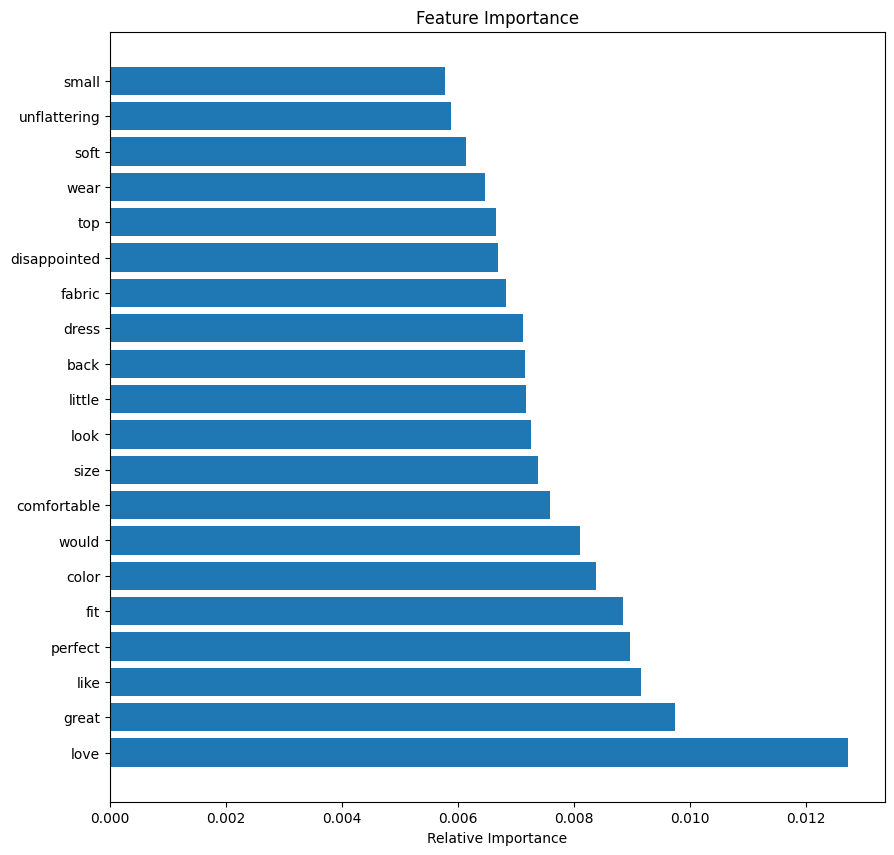

In [ ]:
y_pos = np.arange(len(y_value))
plt.figure(figsize=(10,10))
plt.barh(y_pos, x_value, align='center')
plt.yticks(y_pos, y_value)
plt.xlabel('Relative Importance')
plt.title('Feature Importance')
plt.savefig('Feature Importance.png')

In [ ]:
# Creating a plot for feature importance
def importance_plotting(data,x,y,palette,title):
    sns.set(style="whitegrid")
    ft = sns.PairGrid(data,y_vars=y,x_vars=x,size=6,aspect=1)
    ft.map(sns.stripplot,orient='h',palette=palette, edgecolor="black",size=15)
    for ax, title in zip(ft.axes.flat, titles):
    # Set a different title for each axes
        ax.set(title=title)
    # Make the grid horizontal instead of vertical
        ax.xaxis.grid(False)
        ax.yaxis.grid(True)
        plt.show()

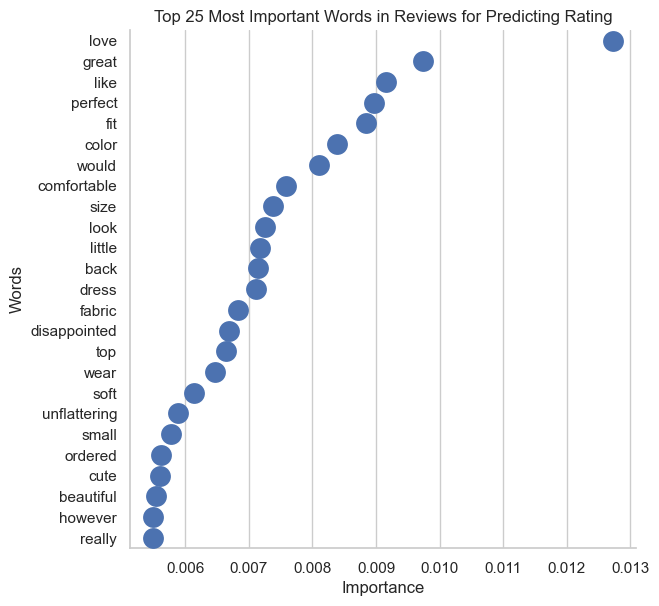

In [ ]:
def importance_plotting(data, x, y, palette, title):
    sns.set(style="whitegrid")
    ft = sns.PairGrid(data, y_vars=y, x_vars=x, height=6, aspect=1)
    ft.map(sns.stripplot, orient='h', palette=palette, edgecolor="black", size=15)
    for ax, title in zip(ft.axes.flat, titles):
        ax.set(title=title)
    plt.show()

fi = {'Words': feature_list, 'Importance': importances}
# Take these into a dataframe, rank highest to lowest then slice top 25
Importance = pd.DataFrame(fi, index=None).sort_values('Importance', ascending=False).head(25)
# Plot the graph!
titles = ["Top 25 Most Important Words in Reviews for Predicting Rating"]
importance_plotting(Importance, 'Importance', 'Words', 'GnBu_r', titles)

In [ ]:
# Get numerical feature importances
importances = list(xgb_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, importance) for feature, importance in zip(feature_list, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
feature_importances = feature_importances[0:20]
# Print out the feature and importances
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: wanted love          Importance: 0.018676448613405228
Variable: disappointed         Importance: 0.01545468159019947
Variable: unflattering         Importance: 0.01442580297589302
Variable: cheap                Importance: 0.013352439738810062
Variable: returned             Importance: 0.012350454926490784
Variable: returning            Importance: 0.010494961403310299
Variable: perfect              Importance: 0.010367068462073803
Variable: looked               Importance: 0.010364680550992489
Variable: comfortable          Importance: 0.009980968199670315
Variable: unfortunately        Importance: 0.009761716239154339
Variable: bad                  Importance: 0.00888881180435419
Variable: going back           Importance: 0.008807837963104248
Variable: compliment           Importance: 0.00865898746997118
Variable: perfectly            Importance: 0.008539916947484016
Variable: huge                 Importance: 0.008152902126312256
Variable: strange              Importance: 0

In [ ]:
# Plot Feature Importance
y_value = []
x_value = []
for i in range(len(feature_importances)):
    y_value.append(feature_importances[i][0])
    x_value.append(feature_importances[i][1])

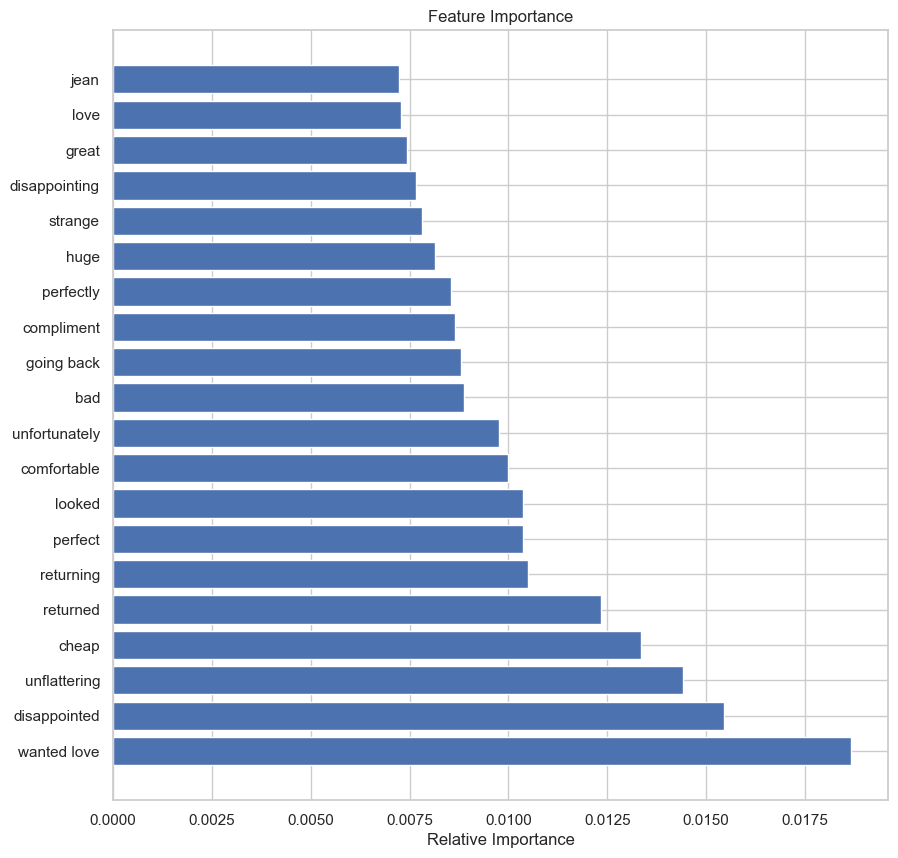

In [ ]:
y_pos = np.arange(len(y_value))
plt.figure(figsize=(10,10))
plt.barh(y_pos, x_value, align='center')
plt.yticks(y_pos, y_value)
plt.xlabel('Relative Importance')
plt.title('Feature Importance')
plt.savefig('Feature Importance.png')

In [ ]:
# Creating a plot for feature importance
def importance_plotting(data,x,y,palette,title):
    sns.set(style="whitegrid")
    ft = sns.PairGrid(data,y_vars=y,x_vars=x,size=6,aspect=1)
    ft.map(sns.stripplot,orient='h',palette=palette, edgecolor="black",size=15)
    for ax, title in zip(ft.axes.flat, titles):
    # Set a different title for each axes
        ax.set(title=title)
    # Make the grid horizontal instead of vertical
        ax.xaxis.grid(False)
        ax.yaxis.grid(True)
        plt.show()

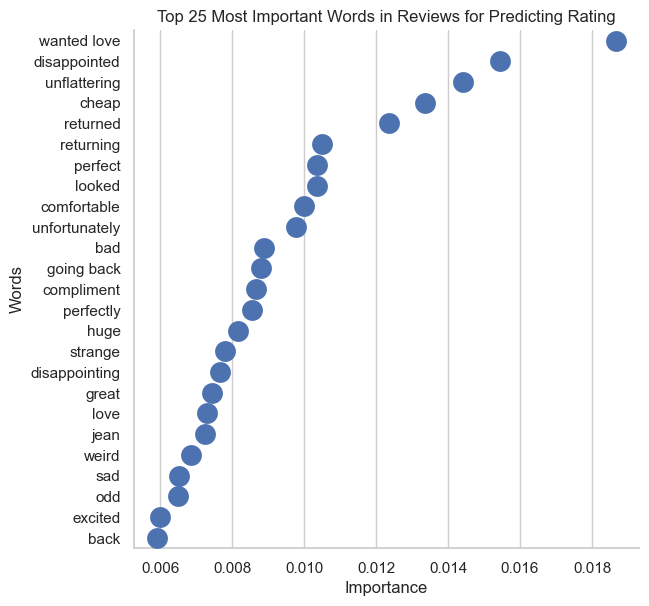

In [ ]:
def importance_plotting(data, x, y, palette, title):
    sns.set(style="whitegrid")
    ft = sns.PairGrid(data, y_vars=y, x_vars=x, height=6, aspect=1)
    ft.map(sns.stripplot, orient='h', palette=palette, edgecolor="black", size=15)
    for ax, title in zip(ft.axes.flat, titles):
        ax.set(title=title)
    plt.show()

fi = {'Words': feature_list, 'Importance': importances}
# Take these into a dataframe, rank highest to lowest then slice top 25
Importance = pd.DataFrame(fi, index=None).sort_values('Importance', ascending=False).head(25)
# Plot the graph!
titles = ["Top 25 Most Important Words in Reviews for Predicting Rating"]
importance_plotting(Importance, 'Importance', 'Words', 'GnBu_r', titles)

## Conclusion

The prediction model provides valuable insights from the analysis of customer reviews.

Words like "size" and "fabric" suggest that customers care about product quality and find items that fit them well.

Additionally, words such as "wanted," "love," "disappointed," "cheap," "perfected," and "comfortable" indicate the significance of clothing in influencing customer satisfaction.

Machine learning models for text analysis of customer reviews offer interesting insights into predicting ratings.
Business would improve product quality, address customer concerns, and enhance overall customer satisfaction. These insights can support businesses in implementing effective strategies and making informed decisions.